# Project deliverable : 2nd Improvement
### Choudhary Usman Alam 
### Saadi Humayun
### Instructor : Sir Murtaza Taj
### TA : Aamil Khan

# Importing Necessary Libraries

In [2]:
import os
import shutil
import json
import random

import torch
import torchvision
from torchvision import transforms
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Rectangle
import numpy as np
from tqdm.notebook import tqdm
!pip install PytorchWildlife

# Importing MegaDetector Detection Model 

In [3]:
from PytorchWildlife.models import detection as pw_detection
detection_model = pw_detection.MegaDetectorV6(version='MDV6-yolov9-c', device='cuda')

Ultralytics 8.3.120 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9c summary (fused): 156 layers, 25,321,561 parameters, 0 gradients, 102.3 GFLOPs


# Flattening Image Directories

In [ ]:
src_root = '/kaggle/input/missouri-deer-species'
dst_root = '/kaggle/working/flattened_dataset'

for class_name in os.listdir(src_root):
    class_path = os.path.join(src_root, class_name)
    
    if not os.path.isdir(class_path):
        continue
    print(f"Processing class: {class_name}")
    flattened_class_dir = os.path.join(dst_root, class_name)
    os.makedirs(flattened_class_dir, exist_ok=True)
    for subfolder in os.listdir(class_path):
        subfolder_path = os.path.join(class_path, subfolder)
        
        if not os.path.isdir(subfolder_path):
            continue
        for filename in os.listdir(subfolder_path):
            src_img = os.path.join(subfolder_path, filename)
            dst_img = os.path.join(flattened_class_dir, f"{subfolder}_{filename}")
            shutil.copy2(src_img, dst_img)

print(" Flattening complete.")

Processing class: 1.57-Red_Deer
Processing class: 1.58-Roe_Deer
Processing class: 1.07-Red_Brocket_Deer
Processing class: 1.27-White_Tailed_Deer
 Flattening complete.


# Visualizing the dataset

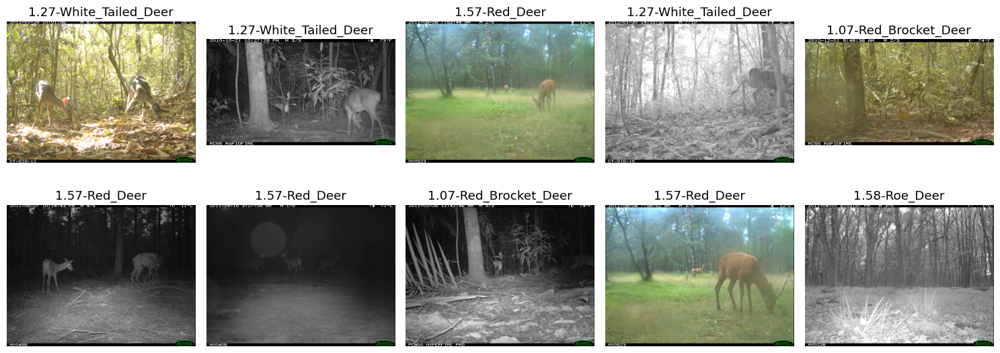

In [3]:
flattened_root = '/kaggle/working/flattened_dataset'
all_images = []
for class_name in os.listdir(flattened_root):
    class_dir = os.path.join(flattened_root, class_name)
    if not os.path.isdir(class_dir):
        continue
    for img_file in os.listdir(class_dir):
        all_images.append((os.path.join(class_dir, img_file), class_name))

random_images = random.sample(all_images, 10)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for ax, (img_path, label) in zip(axes.flatten(), random_images):
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
display(fig)

# Detection of Animals using MegaDetector 

In [ ]:
flattened_root = "/kaggle/working/flattened_dataset"
detection_model = pw_detection.MegaDetectorV6(version="MDV6-yolov9-c")
detection_data = {}

for root, dirs, files in os.walk(flattened_root):
    for file in tqdm(files, desc=f"Processing images in {root}"):
        if not file.lower().endswith((".jpg", ".jpeg", ".png")):
            continue
        img_path = os.path.join(root, file)
        relative_path = os.path.relpath(img_path, flattened_root)
        try:
            img_pil = Image.open(img_path).convert("RGB")
            img_np = np.array(img_pil)
            result = detection_model.single_image_detection(img_np)
            detections = result["detections"]
            detection_data[relative_path] = []
            for i in range(len(detections.xyxy)):
                bbox = detections.xyxy[i].tolist()
                conf = float(detections.confidence[i])
                class_id = int(detections.class_id[i])
                detection_data[relative_path].append({
                    "bbox": bbox,
                    "confidence": conf,
                    "class": "animal"
                })

        except Exception as e:
            print(f"Error processing {img_path}: {e}")

with open("flattened_detections.json", "w") as f:
    json.dump(detection_data, f, indent=2)

print("Detection results saved to flattened_detections.json")

Ultralytics 8.3.111 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9c summary (fused): 156 layers, 25,321,561 parameters, 0 gradients, 102.3 GFLOPs


Processing images in /kaggle/working/flattened_dataset: 0it [00:00, ?it/s]
Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   0%|          | 0/1271 [00:00<?, ?it/s]


0: 640x640 1 animal, 47.5ms
Speed: 4.4ms preprocess, 47.5ms inference, 242.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   0%|          | 1/1271 [00:00<10:39,  1.99it/s]


0: 640x640 1 animal, 45.9ms
Speed: 2.9ms preprocess, 45.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 45.9ms
Speed: 2.7ms preprocess, 45.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   0%|          | 3/1271 [00:00<04:04,  5.18it/s]


0: 640x640 1 animal, 42.8ms
Speed: 2.9ms preprocess, 42.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 31.6ms
Speed: 2.8ms preprocess, 31.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   0%|          | 5/1271 [00:00<02:45,  7.65it/s]


0: 640x640 1 animal, 31.6ms
Speed: 2.7ms preprocess, 31.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 31.6ms
Speed: 2.8ms preprocess, 31.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|          | 7/1271 [00:00<02:09,  9.75it/s]


0: 640x640 1 animal, 31.6ms
Speed: 2.8ms preprocess, 31.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 27.7ms
Speed: 2.7ms preprocess, 27.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|          | 9/1271 [00:01<01:50, 11.43it/s]


0: 640x640 (no detections), 27.7ms
Speed: 2.7ms preprocess, 27.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.3ms
Speed: 2.6ms preprocess, 26.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|          | 11/1271 [00:01<01:38, 12.79it/s]


0: 640x640 1 animal, 26.3ms
Speed: 2.7ms preprocess, 26.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 2.9ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|          | 13/1271 [00:01<01:29, 14.11it/s]


0: 640x640 1 animal, 24.9ms
Speed: 2.6ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 animals, 24.2ms
Speed: 2.6ms preprocess, 24.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|          | 15/1271 [00:01<01:25, 14.68it/s]


0: 640x640 1 animal, 24.2ms
Speed: 2.8ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|▏         | 17/1271 [00:01<01:23, 15.08it/s]


0: 640x640 1 animal, 24.2ms
Speed: 2.8ms preprocess, 24.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.7ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|▏         | 19/1271 [00:01<01:21, 15.31it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.7ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.1ms
Speed: 2.8ms preprocess, 24.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   2%|▏         | 21/1271 [00:01<01:21, 15.29it/s]


0: 640x640 1 animal, 24.2ms
Speed: 2.7ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.1ms
Speed: 2.8ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   2%|▏         | 23/1271 [00:01<01:21, 15.40it/s]


0: 640x640 1 animal, 24.1ms
Speed: 3.0ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   2%|▏         | 25/1271 [00:02<01:20, 15.49it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.6ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   2%|▏         | 27/1271 [00:02<01:20, 15.53it/s]


0: 640x640 1 animal, 24.1ms
Speed: 3.0ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 2.7ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   2%|▏         | 29/1271 [00:02<01:21, 15.28it/s]


0: 640x640 (no detections), 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   2%|▏         | 31/1271 [00:02<01:20, 15.43it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   3%|▎         | 33/1271 [00:02<01:19, 15.59it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.8ms preprocess, 24.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 2.7ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   3%|▎         | 35/1271 [00:02<01:19, 15.51it/s]


0: 640x640 1 animal, 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.1ms
Speed: 2.7ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   3%|▎         | 37/1271 [00:02<01:20, 15.24it/s]


0: 640x640 2 animals, 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 3.0ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   3%|▎         | 39/1271 [00:02<01:21, 15.13it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.1ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.7ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   3%|▎         | 41/1271 [00:03<01:20, 15.28it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.7ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   3%|▎         | 43/1271 [00:03<01:20, 15.21it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 2.8ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▎         | 45/1271 [00:03<01:20, 15.17it/s]


0: 640x640 1 animal, 24.6ms
Speed: 3.4ms preprocess, 24.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▎         | 47/1271 [00:03<01:21, 15.03it/s]


0: 640x640 1 animal, 24.4ms
Speed: 2.9ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.7ms
Speed: 2.9ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▍         | 49/1271 [00:03<01:20, 15.21it/s]


0: 640x640 1 animal, 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▍         | 51/1271 [00:03<01:20, 15.23it/s]


0: 640x640 2 animals, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.0ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▍         | 53/1271 [00:03<01:19, 15.32it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.9ms
Speed: 2.9ms preprocess, 24.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▍         | 55/1271 [00:04<01:18, 15.44it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 2.7ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▍         | 57/1271 [00:04<01:18, 15.45it/s]


0: 640x640 (no detections), 25.1ms
Speed: 3.0ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 2.9ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   5%|▍         | 59/1271 [00:04<01:17, 15.67it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.3ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   5%|▍         | 61/1271 [00:04<01:16, 15.91it/s]


0: 640x640 1 animal, 25.1ms
Speed: 2.8ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 25.1ms
Speed: 3.3ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   5%|▍         | 63/1271 [00:04<01:15, 15.94it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.9ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 animals, 23.6ms
Speed: 2.9ms preprocess, 23.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   5%|▌         | 65/1271 [00:04<01:16, 15.77it/s]


0: 640x640 1 animal, 23.8ms
Speed: 3.1ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.4ms
Speed: 2.6ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   5%|▌         | 67/1271 [00:04<01:15, 15.92it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   5%|▌         | 69/1271 [00:04<01:15, 16.02it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.8ms preprocess, 24.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   6%|▌         | 71/1271 [00:05<01:15, 15.91it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.8ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 2.6ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   6%|▌         | 73/1271 [00:05<01:15, 15.96it/s]


0: 640x640 2 animals, 24.1ms
Speed: 3.0ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 2.7ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   6%|▌         | 75/1271 [00:05<01:15, 15.89it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   6%|▌         | 77/1271 [00:05<01:13, 16.25it/s]


0: 640x640 1 animal, 23.6ms
Speed: 2.9ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   6%|▌         | 79/1271 [00:05<01:13, 16.21it/s]


0: 640x640 (no detections), 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   6%|▋         | 81/1271 [00:05<01:12, 16.31it/s]


0: 640x640 (no detections), 24.5ms
Speed: 2.7ms preprocess, 24.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 83/1271 [00:05<01:12, 16.42it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.9ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.7ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 85/1271 [00:05<01:12, 16.36it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 2.6ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 87/1271 [00:06<01:13, 16.16it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.6ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.9ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 89/1271 [00:06<01:12, 16.33it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.3ms
Speed: 2.8ms preprocess, 23.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 91/1271 [00:06<01:11, 16.45it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.4ms
Speed: 2.9ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 93/1271 [00:06<01:13, 16.03it/s]


0: 640x640 1 animal, 23.5ms
Speed: 2.6ms preprocess, 23.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 95/1271 [00:06<01:11, 16.36it/s]


0: 640x640 (no detections), 23.5ms
Speed: 2.8ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.4ms
Speed: 2.7ms preprocess, 23.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   8%|▊         | 97/1271 [00:06<01:10, 16.57it/s]


0: 640x640 1 animal, 23.8ms
Speed: 3.1ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.5ms
Speed: 2.8ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   8%|▊         | 99/1271 [00:06<01:12, 16.27it/s]


0: 640x640 (no detections), 23.4ms
Speed: 2.6ms preprocess, 23.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 2.8ms preprocess, 25.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   8%|▊         | 101/1271 [00:06<01:09, 16.72it/s]


0: 640x640 1 animal, 25.1ms
Speed: 2.7ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.6ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   8%|▊         | 103/1271 [00:06<01:10, 16.63it/s]


0: 640x640 (no detections), 24.7ms
Speed: 2.9ms preprocess, 24.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   8%|▊         | 105/1271 [00:07<01:11, 16.31it/s]


0: 640x640 1 animal, 24.6ms
Speed: 2.6ms preprocess, 24.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 2.7ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   8%|▊         | 107/1271 [00:07<01:10, 16.40it/s]


0: 640x640 (no detections), 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.9ms
Speed: 2.7ms preprocess, 24.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   9%|▊         | 109/1271 [00:07<01:11, 16.29it/s]


0: 640x640 (no detections), 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.6ms
Speed: 3.2ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   9%|▊         | 111/1271 [00:07<01:11, 16.23it/s]


0: 640x640 1 animal, 23.4ms
Speed: 2.8ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.4ms
Speed: 3.6ms preprocess, 23.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   9%|▉         | 113/1271 [00:07<01:11, 16.23it/s]


0: 640x640 2 animals, 23.2ms
Speed: 2.9ms preprocess, 23.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.7ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   9%|▉         | 115/1271 [00:07<01:11, 16.24it/s]


0: 640x640 1 animal, 23.4ms
Speed: 3.0ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.4ms
Speed: 2.7ms preprocess, 23.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   9%|▉         | 117/1271 [00:07<01:09, 16.54it/s]


0: 640x640 1 animal, 23.2ms
Speed: 2.9ms preprocess, 23.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.6ms
Speed: 3.1ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   9%|▉         | 119/1271 [00:07<01:08, 16.84it/s]


0: 640x640 2 animals, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.6ms
Speed: 2.8ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|▉         | 121/1271 [00:08<01:09, 16.66it/s]


0: 640x640 2 animals, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|▉         | 123/1271 [00:08<01:10, 16.30it/s]


0: 640x640 1 animal, 23.7ms
Speed: 2.7ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.6ms
Speed: 2.9ms preprocess, 23.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|▉         | 125/1271 [00:08<01:09, 16.41it/s]


0: 640x640 1 animal, 23.4ms
Speed: 2.7ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.2ms
Speed: 2.6ms preprocess, 23.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|▉         | 127/1271 [00:08<01:09, 16.51it/s]


0: 640x640 1 animal, 23.4ms
Speed: 2.9ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|█         | 129/1271 [00:08<01:09, 16.49it/s]


0: 640x640 1 animal, 23.5ms
Speed: 2.6ms preprocess, 23.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.6ms
Speed: 3.1ms preprocess, 23.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|█         | 131/1271 [00:08<01:09, 16.40it/s]


0: 640x640 1 animal, 23.3ms
Speed: 2.8ms preprocess, 23.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.1ms
Speed: 2.6ms preprocess, 23.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|█         | 133/1271 [00:08<01:10, 16.15it/s]


0: 640x640 1 animal, 23.6ms
Speed: 2.9ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.6ms
Speed: 2.8ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  11%|█         | 135/1271 [00:08<01:09, 16.31it/s]


0: 640x640 (no detections), 23.4ms
Speed: 2.7ms preprocess, 23.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.5ms
Speed: 2.8ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  11%|█         | 137/1271 [00:09<01:08, 16.65it/s]


0: 640x640 1 animal, 23.6ms
Speed: 3.0ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.4ms
Speed: 2.7ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  11%|█         | 139/1271 [00:09<01:07, 16.72it/s]


0: 640x640 1 animal, 23.7ms
Speed: 3.0ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.5ms
Speed: 2.9ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  11%|█         | 141/1271 [00:09<01:09, 16.25it/s]


0: 640x640 1 animal, 23.5ms
Speed: 2.6ms preprocess, 23.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.5ms
Speed: 3.2ms preprocess, 23.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  11%|█▏        | 143/1271 [00:09<01:09, 16.34it/s]


0: 640x640 1 animal, 23.1ms
Speed: 3.1ms preprocess, 23.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.4ms
Speed: 3.3ms preprocess, 23.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  11%|█▏        | 145/1271 [00:09<01:08, 16.36it/s]


0: 640x640 1 animal, 23.1ms
Speed: 2.8ms preprocess, 23.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.3ms
Speed: 3.1ms preprocess, 23.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  12%|█▏        | 147/1271 [00:09<01:10, 15.98it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.7ms preprocess, 23.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.7ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  12%|█▏        | 149/1271 [00:09<01:09, 16.14it/s]


0: 640x640 1 animal, 24.3ms
Speed: 2.8ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.4ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  12%|█▏        | 151/1271 [00:09<01:08, 16.45it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.8ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  12%|█▏        | 153/1271 [00:10<01:11, 15.60it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  12%|█▏        | 155/1271 [00:10<01:09, 16.09it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 2.7ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  12%|█▏        | 157/1271 [00:10<01:08, 16.21it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 159/1271 [00:10<01:09, 15.93it/s]


0: 640x640 1 animal, 23.9ms
Speed: 2.6ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.8ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 161/1271 [00:10<01:09, 16.06it/s]


0: 640x640 (no detections), 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.9ms
Speed: 2.7ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 163/1271 [00:10<01:09, 16.00it/s]


0: 640x640 1 animal, 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.8ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 165/1271 [00:10<01:09, 15.93it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.7ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.6ms
Speed: 2.8ms preprocess, 23.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 167/1271 [00:10<01:06, 16.52it/s]


0: 640x640 1 animal, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.8ms
Speed: 2.7ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 169/1271 [00:11<01:06, 16.53it/s]


0: 640x640 (no detections), 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 171/1271 [00:11<01:06, 16.49it/s]


0: 640x640 (no detections), 24.2ms
Speed: 2.8ms preprocess, 24.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.6ms
Speed: 3.0ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  14%|█▎        | 173/1271 [00:11<01:06, 16.59it/s]


0: 640x640 1 animal, 23.7ms
Speed: 3.0ms preprocess, 23.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.7ms
Speed: 2.6ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  14%|█▍        | 175/1271 [00:11<01:07, 16.32it/s]


0: 640x640 2 animals, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.9ms preprocess, 23.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  14%|█▍        | 177/1271 [00:11<01:07, 16.16it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.7ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 2.7ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  14%|█▍        | 179/1271 [00:11<01:06, 16.43it/s]


0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.7ms
Speed: 2.6ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  14%|█▍        | 181/1271 [00:11<01:05, 16.57it/s]


0: 640x640 (no detections), 23.7ms
Speed: 3.2ms preprocess, 23.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  14%|█▍        | 183/1271 [00:11<01:06, 16.38it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.0ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 2.9ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▍        | 185/1271 [00:12<01:06, 16.40it/s]


0: 640x640 1 animal, 24.4ms
Speed: 2.7ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.6ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▍        | 187/1271 [00:12<01:05, 16.62it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.9ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▍        | 189/1271 [00:12<01:04, 16.66it/s]


0: 640x640 1 animal, 23.7ms
Speed: 2.7ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 3.2ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▌        | 191/1271 [00:12<01:05, 16.52it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.7ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 2.6ms preprocess, 24.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▌        | 193/1271 [00:12<01:04, 16.67it/s]


0: 640x640 1 animal, 23.4ms
Speed: 2.8ms preprocess, 23.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▌        | 195/1271 [00:12<01:05, 16.49it/s]


0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▌        | 197/1271 [00:12<01:05, 16.51it/s]


0: 640x640 1 animal, 23.4ms
Speed: 2.9ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 2.9ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  16%|█▌        | 199/1271 [00:12<01:04, 16.62it/s]


0: 640x640 (no detections), 23.3ms
Speed: 3.1ms preprocess, 23.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.7ms
Speed: 3.0ms preprocess, 23.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  16%|█▌        | 201/1271 [00:12<01:06, 16.10it/s]


0: 640x640 1 animal, 23.5ms
Speed: 2.8ms preprocess, 23.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 3.1ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  16%|█▌        | 203/1271 [00:13<01:05, 16.26it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.6ms
Speed: 2.6ms preprocess, 23.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  16%|█▌        | 205/1271 [00:13<01:04, 16.55it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.9ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  16%|█▋        | 207/1271 [00:13<01:05, 16.18it/s]


0: 640x640 1 animal, 23.7ms
Speed: 2.6ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.8ms preprocess, 23.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  16%|█▋        | 209/1271 [00:13<01:05, 16.16it/s]


0: 640x640 1 animal, 23.6ms
Speed: 2.8ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  17%|█▋        | 211/1271 [00:13<01:04, 16.47it/s]


0: 640x640 2 animals, 23.6ms
Speed: 3.2ms preprocess, 23.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.1ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  17%|█▋        | 213/1271 [00:13<01:04, 16.44it/s]


0: 640x640 1 animal, 23.9ms
Speed: 2.7ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.1ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  17%|█▋        | 215/1271 [00:13<01:03, 16.52it/s]


0: 640x640 1 animal, 23.9ms
Speed: 3.0ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.6ms
Speed: 2.8ms preprocess, 24.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  17%|█▋        | 217/1271 [00:13<01:02, 16.83it/s]


0: 640x640 1 animal, 23.6ms
Speed: 3.0ms preprocess, 23.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.5ms
Speed: 2.9ms preprocess, 23.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  17%|█▋        | 219/1271 [00:14<01:02, 16.76it/s]


0: 640x640 1 animal, 23.4ms
Speed: 2.9ms preprocess, 23.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.7ms
Speed: 2.9ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  17%|█▋        | 221/1271 [00:14<01:02, 16.75it/s]


0: 640x640 (no detections), 23.5ms
Speed: 2.9ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.3ms
Speed: 2.9ms preprocess, 23.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 223/1271 [00:14<01:01, 17.05it/s]


0: 640x640 1 animal, 23.7ms
Speed: 3.1ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.9ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 225/1271 [00:14<01:03, 16.40it/s]


0: 640x640 1 animal, 23.5ms
Speed: 2.8ms preprocess, 23.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.2ms
Speed: 3.0ms preprocess, 23.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 227/1271 [00:14<01:04, 16.09it/s]


0: 640x640 (no detections), 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.6ms
Speed: 2.6ms preprocess, 23.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 229/1271 [00:14<01:04, 16.04it/s]


0: 640x640 (no detections), 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.7ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 231/1271 [00:14<01:03, 16.26it/s]


0: 640x640 1 animal, 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 233/1271 [00:14<01:03, 16.36it/s]


0: 640x640 1 animal, 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 235/1271 [00:15<01:02, 16.54it/s]


0: 640x640 (no detections), 24.6ms
Speed: 3.4ms preprocess, 24.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  19%|█▊        | 237/1271 [00:15<01:03, 16.31it/s]


0: 640x640 1 animal, 24.3ms
Speed: 2.9ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.5ms
Speed: 2.8ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  19%|█▉        | 239/1271 [00:15<01:02, 16.49it/s]


0: 640x640 1 animal, 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.6ms preprocess, 24.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  19%|█▉        | 241/1271 [00:15<01:01, 16.70it/s]


0: 640x640 (no detections), 23.7ms
Speed: 2.9ms preprocess, 23.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.6ms
Speed: 2.8ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  19%|█▉        | 243/1271 [00:15<01:02, 16.43it/s]


0: 640x640 (no detections), 24.2ms
Speed: 2.6ms preprocess, 24.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.8ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  19%|█▉        | 245/1271 [00:15<01:00, 16.87it/s]


0: 640x640 1 animal, 23.9ms
Speed: 2.8ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.5ms
Speed: 2.6ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  19%|█▉        | 247/1271 [00:15<01:00, 16.94it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  20%|█▉        | 249/1271 [00:15<01:00, 16.84it/s]


0: 640x640 1 animal, 24.3ms
Speed: 2.7ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  20%|█▉        | 251/1271 [00:15<01:00, 16.87it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  20%|█▉        | 253/1271 [00:16<01:00, 16.93it/s]


0: 640x640 1 animal, 24.3ms
Speed: 3.0ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 2.7ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  20%|██        | 255/1271 [00:16<01:02, 16.36it/s]


0: 640x640 1 animal, 24.4ms


# Visualization of the Bounding-box around animals 

Ultralytics 8.3.120 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9c summary (fused): 156 layers, 25,321,561 parameters, 0 gradients, 102.3 GFLOPs

0: 640x640 1 animal, 48.8ms
Speed: 26.7ms preprocess, 48.8ms inference, 276.2ms postprocess per image at shape (1, 3, 640, 640)


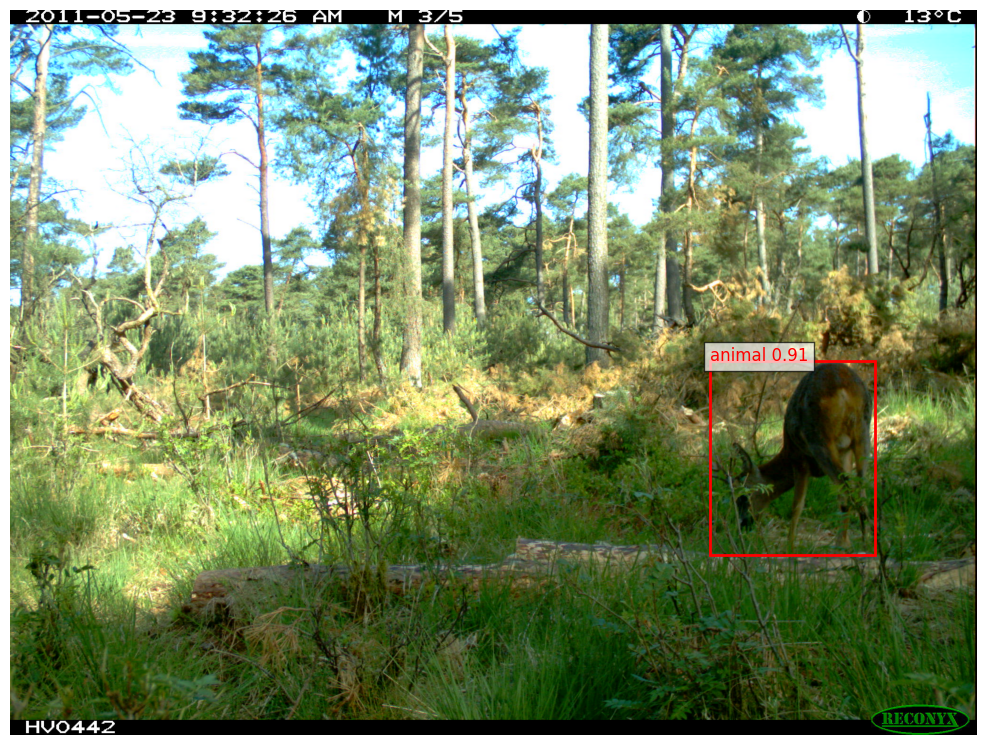


0: 640x640 1 animal, 48.9ms
Speed: 2.9ms preprocess, 48.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


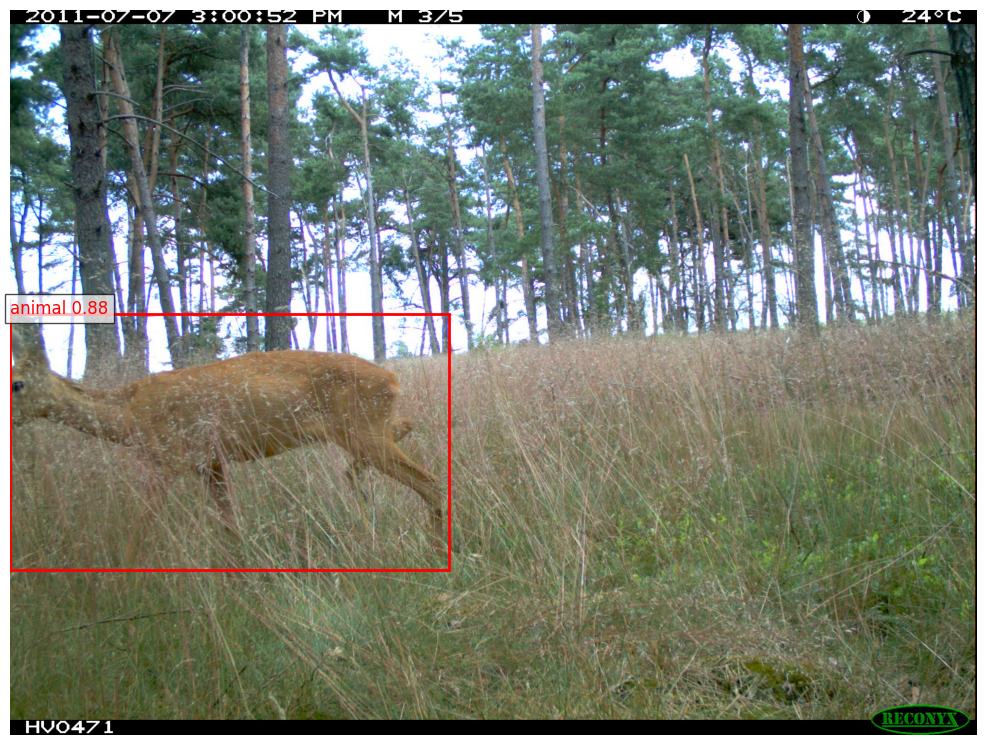


0: 640x640 1 animal, 48.9ms
Speed: 3.1ms preprocess, 48.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


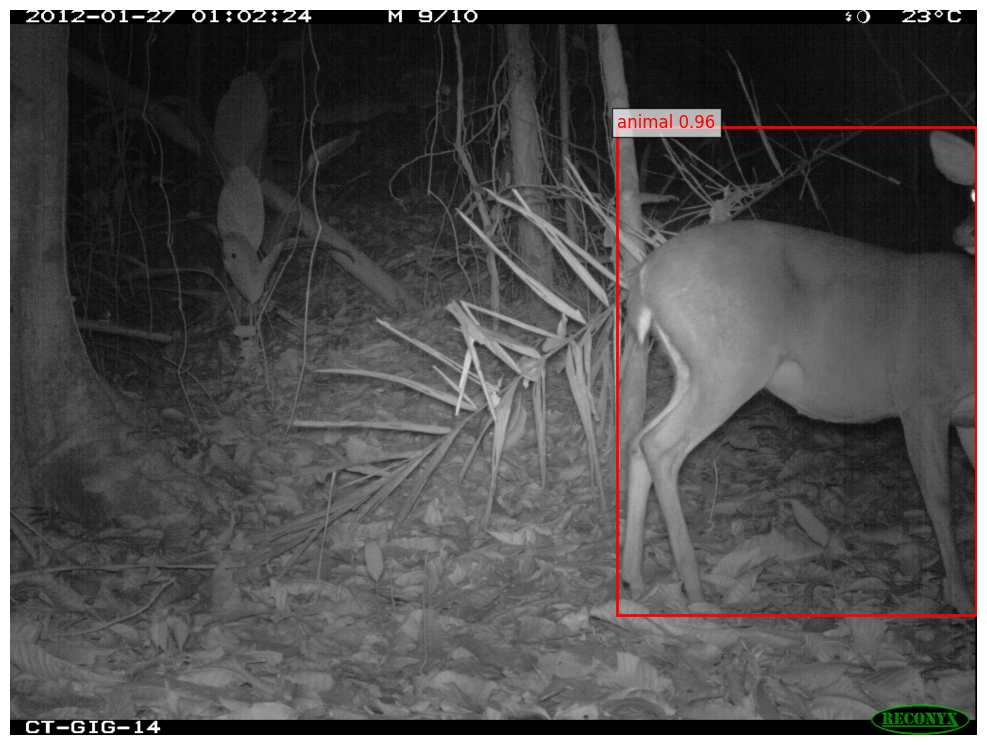


0: 640x640 1 animal, 48.9ms
Speed: 2.9ms preprocess, 48.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


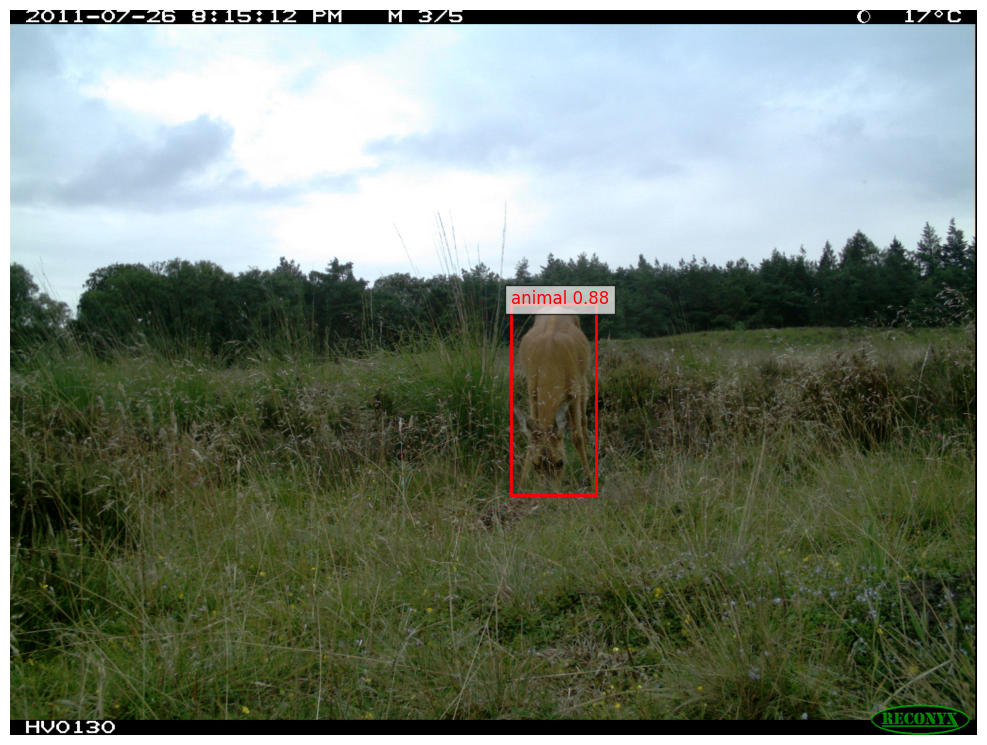


0: 640x640 (no detections), 48.9ms
Speed: 2.8ms preprocess, 48.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


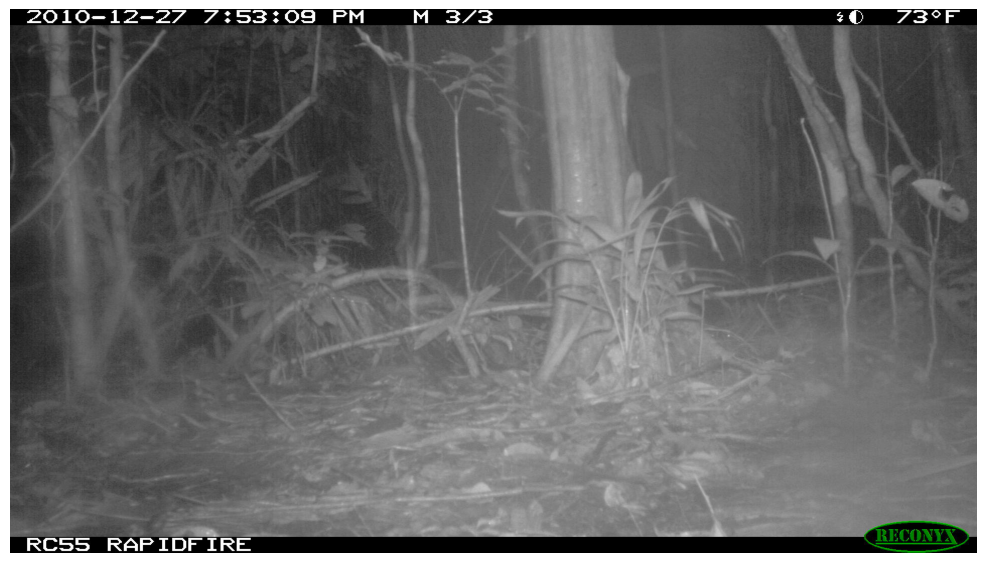


0: 640x640 1 animal, 48.9ms
Speed: 3.2ms preprocess, 48.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


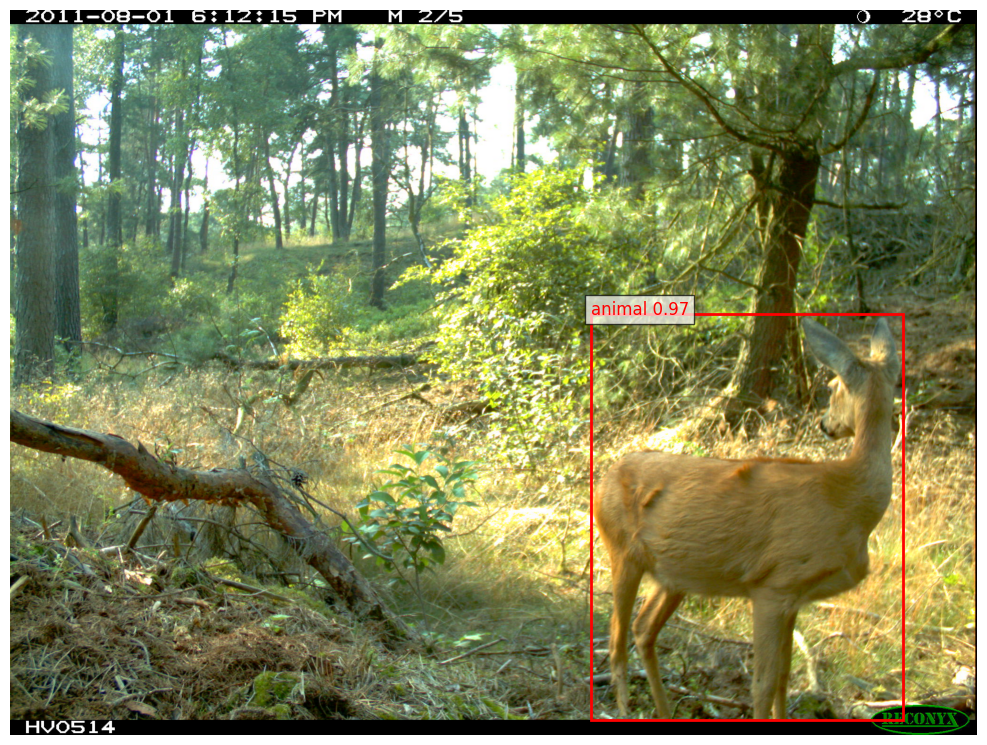


0: 640x640 1 animal, 48.9ms
Speed: 3.1ms preprocess, 48.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


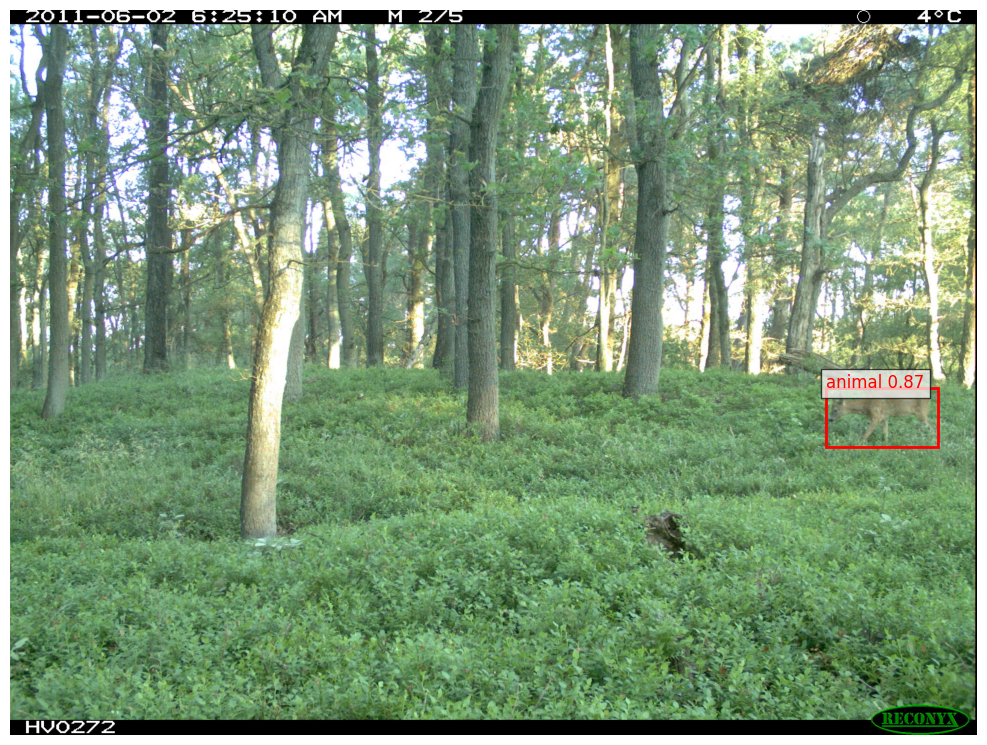


0: 640x640 1 animal, 48.9ms
Speed: 2.5ms preprocess, 48.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


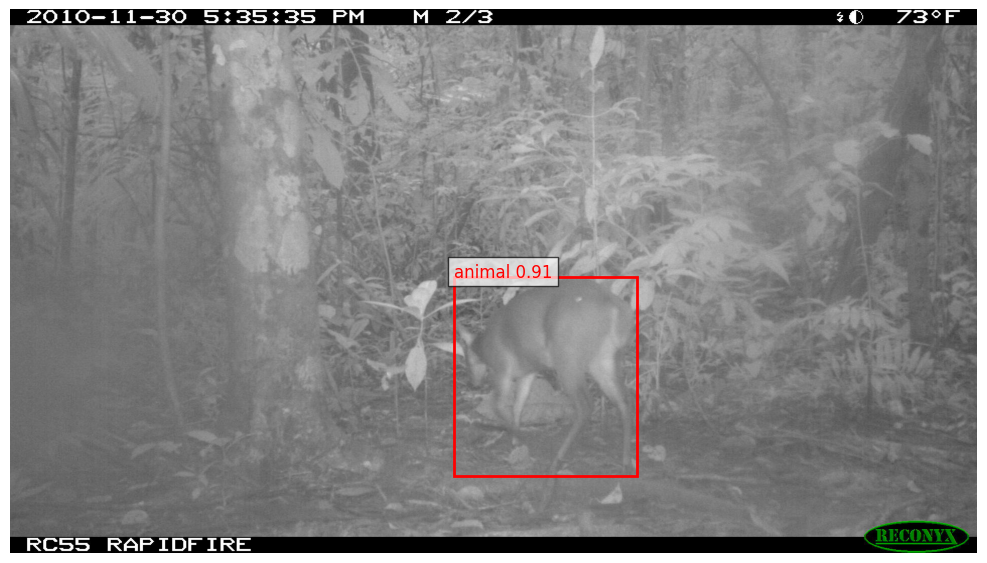


0: 640x640 1 animal, 48.9ms
Speed: 2.9ms preprocess, 48.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


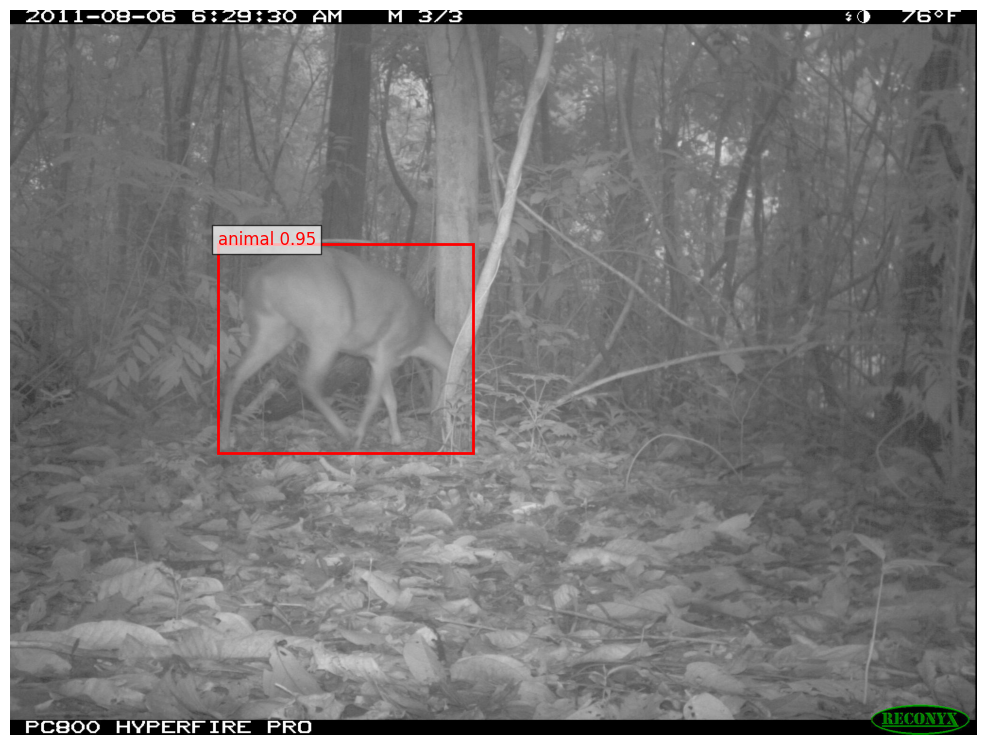


0: 640x640 3 animals, 48.9ms
Speed: 3.1ms preprocess, 48.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


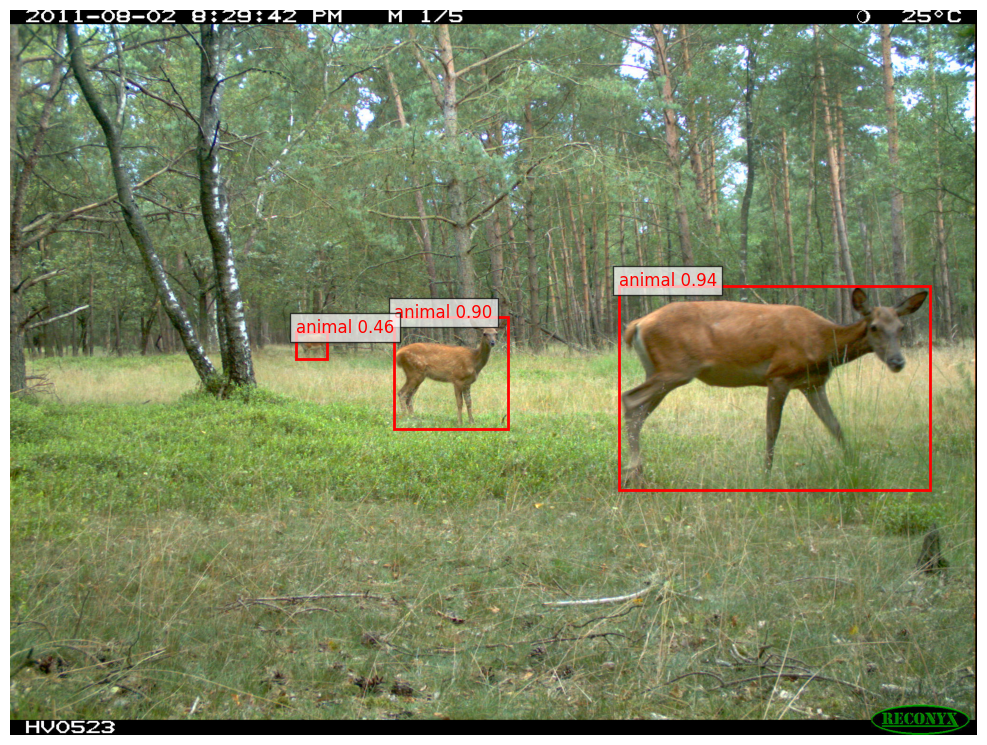

In [8]:
detection_model = pw_detection.MegaDetectorV6(version="MDV6-yolov9-c")
dataset_root = "/kaggle/input/missouri-deer-species"
all_image_paths = []

for class_folder in os.listdir(dataset_root):
    class_path = os.path.join(dataset_root, class_folder)
    if not os.path.isdir(class_path):
        continue
    for seq_folder in os.listdir(class_path):
        seq_path = os.path.join(class_path, seq_folder)
        if not os.path.isdir(seq_path):
            continue
        for filename in os.listdir(seq_path):
            if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                all_image_paths.append(os.path.join(seq_path, filename))
random.shuffle(all_image_paths)
sampled_paths = all_image_paths[:10]

for idx, image_path in enumerate(sampled_paths):
    try:
        img_pil = Image.open(image_path).convert("RGB")
        img_np = np.array(img_pil)
        detection_result = detection_model.single_image_detection(img_np)
        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(img_pil)
        detections = detection_result["detections"]
        boxes = detections.xyxy
        confidences = detections.confidence

        for i in range(len(boxes)):
            bbox = boxes[i]
            confidence = confidences[i]
            label = f"animal {confidence:.2f}"
            rect = Rectangle(
                (bbox[0], bbox[1]),
                bbox[2] - bbox[0],
                bbox[3] - bbox[1],
                linewidth=2,
                edgecolor='red',
                facecolor='none'
            )
            ax.add_patch(rect)

            ax.text(
                bbox[0], bbox[1],
                label,
                color='red',
                fontsize=12,
                bbox=dict(facecolor='white', alpha=0.7)
            )

        plt.axis('off')
        plt.tight_layout()
        display(fig)
        plt.close()

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")

# Cropping Images based on Bounding Boxes

In [ ]:
json_file = "/kaggle/input/json-file/megadetector_results.json"
output_crops_dir = "/kaggle/working/cropped_images"

with open(json_file, 'r') as f:
    detections_data = json.load(f)

os.makedirs(output_crops_dir, exist_ok=True)
for img_path, image_data in detections_data.items():
    img_pil = Image.open(img_path).convert("RGB")
    for i, detection in enumerate(image_data["detections"]):
        bbox = detection["bbox"]  
        cropped_img = img_pil.crop((bbox[0], bbox[1], bbox[2], bbox[3]))
        crop_filename = f"{os.path.basename(img_path).split('.')[0]}_{i}.jpg"
        crop_path = os.path.join(output_crops_dir, crop_filename)
        cropped_img.save(crop_path)

# Visualization of Cropped Images

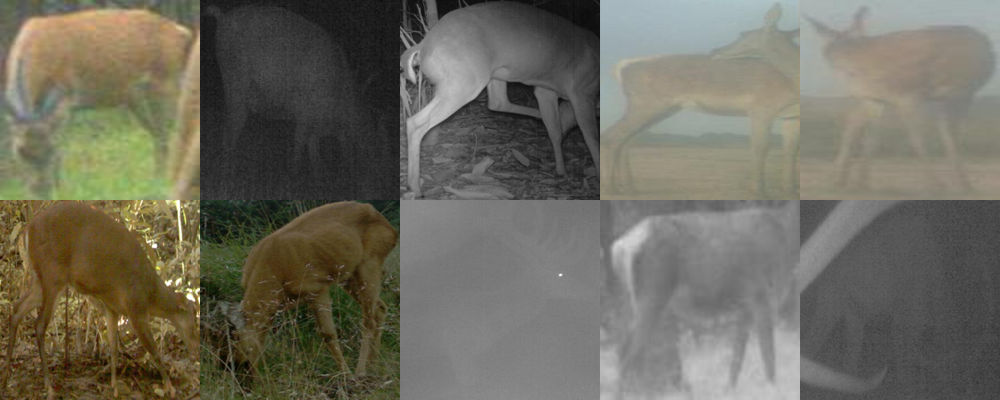

In [ ]:
cropped_dir = '/kaggle/working/cropped_images'
grid_rows, grid_cols = 2, 5
image_size = (224, 224)  
all_images = [
    os.path.join(cropped_dir, f)
    for f in os.listdir(cropped_dir)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
]
random.shuffle(all_images)
selected = all_images[:grid_rows * grid_cols]
grid_img = Image.new('RGB', (image_size[0]*grid_cols, image_size[1]*grid_rows))

for idx, img_path in enumerate(selected):
    img = Image.open(img_path).resize(image_size)
    row, col = divmod(idx, grid_cols)
    grid_img.paste(img, (col * image_size[0], row * image_size[1]))

display(grid_img)

# Preprocessing Images for Classification 

### created 2 datasets : one with clean images and other with nosiy images


In [ ]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.applications.resnet50 import preprocess_input

image_size = (224, 224)
mean = 0
stddev = 25 

cropped_images = []
cropped_images_noisy = []
labels = []

def add_gaussian_noise(img_array, mean=0, stddev=25):
    noise = np.random.normal(mean, stddev, img_array.shape).astype(np.float32)
    noisy_img = img_array + noise
    noisy_img = np.clip(noisy_img, 0, 255)  
    return noisy_img

for img_path, image_data in detections_data.items():
    for i, detection in enumerate(image_data["detections"]):
        crop_filename = f"{os.path.basename(img_path).split('.')[0]}_{i}.jpg"
        crop_path = os.path.join(output_crops_dir, crop_filename)
        
        img = load_img(crop_path, target_size=image_size)
        img_array = img_to_array(img)  
        
        img_clean = preprocess_input(np.expand_dims(img_array.copy(), axis=0))  
        cropped_images.append(img_clean)
        
        img_noisy = add_gaussian_noise(img_array)
        img_noisy_preprocessed = preprocess_input(np.expand_dims(img_noisy, axis=0)) 
        cropped_images_noisy.append(img_noisy_preprocessed)

        species_label = image_data["class_label"]
        labels.append(species_label)

X = np.vstack(cropped_images)              
X_noisy = np.vstack(cropped_images_noisy)  
y = np.array(labels)

clean_y = np.array([s.split('-', 1)[1] for s in y])
classes = np.unique(clean_y)
class_to_idx = {cls: idx for idx, cls in enumerate(classes)}
y_numeric = np.array([class_to_idx[label] for label in clean_y])

print("Mapping:", class_to_idx)
print(f"Prepared {len(X)} clean images and {len(X_noisy)} noisy images for classification.")


2025-04-29 22:24:27.397848: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745965467.611697    1357 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745965467.666499    1357 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Mapping: {'Red_Brocket_Deer': 0, 'Red_Deer': 1, 'Roe_Deer': 2, 'White_Tailed_Deer': 3}
Prepared 8865 clean images and 8865 noisy images for classification.


# Visualization of Noisy images

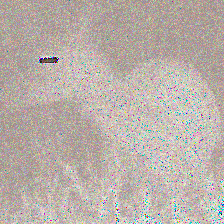

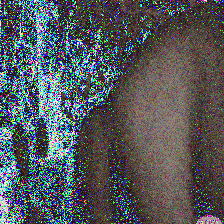

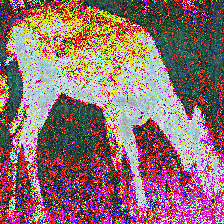

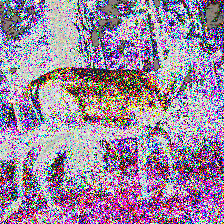

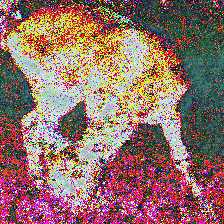

Error: no "view" mailcap rules found for type "image/png"
Error: no "view" mailcap rules found for type "image/png"
Error: no "view" mailcap rules found for type "image/png"
Error: no "view" mailcap rules found for type "image/png"
/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: links: not found


In [ ]:
import numpy as np
from PIL import Image
from IPython.display import display

def display_images(images, labels, num_images=5):
    indices = np.random.choice(len(images), num_images, replace=False)
    
    for idx in indices:
        img = images[idx]
        label = labels[idx]
        img_pil = Image.fromarray(img.astype(np.uint8))
        img_pil.show(title=f"Label: {label}")
        display(img_pil)

display_images(X_noisy, y_numeric, num_images=5)


# CLIP Environment Setup

In [6]:
!pip install ftfy regex tqdm
!pip install git+https://github.com/openai/CLIP.git
!pip install torch torchvision

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-yi89y2px
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-yi89y2px
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


# Importing Libraries

In [7]:
import torch
import clip
from PIL import Image
import os
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
import torch.nn as nn
import torch.optim as optim

# Fine-tuning CLIP on our Dataset

In [ ]:
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import StackingClassifier
from sklearn.utils.class_weight import compute_class_weight
import xgboost as xgb
import clip  
import torch.nn.functional as F

MEAN_BGR = np.array([103.939, 116.779, 123.68], dtype=np.float32)
device = "cuda" if torch.cuda.is_available() else "cpu"

def undo_resnet_preprocess(x):
    bgr = x.copy()
    bgr[..., 0] += MEAN_BGR[0]
    bgr[..., 1] += MEAN_BGR[1]
    bgr[..., 2] += MEAN_BGR[2]
    rgb = bgr[..., ::-1]
    rgb = np.clip(rgb, 0, 255).astype(np.uint8)
    return rgb

class CLIPArrayDataset(Dataset):
    def __init__(self, X, y, preprocess, train=False):
        self.X = X
        self.y = y
        self.preprocess = preprocess
        self.train = train
        self.augment = transforms.Compose([
            transforms.RandomHorizontalFlip(p=0.5),
        ]) if train else None

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        arr = undo_resnet_preprocess(self.X[idx])
        img = Image.fromarray(arr)
        if self.train and self.augment:
            img = self.augment(img)
        img = self.preprocess(img)
        label = int(self.y[idx])
        return img, label

class CLIPFineTune(nn.Module):
    def __init__(self, clip_model, num_classes):
        super(CLIPFineTune, self).__init__()
        self.clip_model = clip_model.visual
        self.classifier = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes),
        )

    def forward(self, x):
        features = self.clip_model(x)
        logits = self.classifier(features)
        return features, logits

class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, weight=self.alpha, reduction='none')
        pt = torch.exp(-ce_loss)
        focal_loss = ((1 - pt) ** self.gamma) * ce_loss

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

model, preprocess = clip.load("ViT-B/32", device=device)
model = model.float()
model.eval()

X_train, X_test, y_train, y_test = train_test_split(
    X, y_numeric, test_size=0.2, stratify=y_numeric, random_state=42
)

train_ds = CLIPArrayDataset(X_train, y_train, preprocess, train=True)
test_ds = CLIPArrayDataset(X_test, y_test, preprocess, train=False)

train_loader = DataLoader(train_ds, batch_size=64, shuffle=True, num_workers=0)
test_loader = DataLoader(test_ds, batch_size=64, shuffle=False, num_workers=0)

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float32).to(device)

print("\n Fine-Tuning CLIP…")
num_classes = len(np.unique(y_train))
clip_finetune = CLIPFineTune(model, num_classes).to(device)
optimizer = optim.Adam(clip_finetune.parameters(), lr=1e-5, weight_decay=1e-4)
criterion = FocalLoss(alpha=class_weights_tensor, gamma=2.0)

num_epochs = 5
clip_finetune.train()
for epoch in range(num_epochs):
    total_loss = 0
    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        _, logits = clip_finetune(imgs)
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {total_loss/len(train_loader):.4f}")

def extract_finetuned_features(loader, model):
    model.eval()
    feats, labs = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            features, _ = model(imgs)
            feats.append(features.cpu().numpy())
            labs.append(labels.numpy())
    return np.vstack(feats), np.concatenate(labs)

print("Extracting fine-tuned train features…")
X_train_feats, y_train_feats = extract_finetuned_features(train_loader, clip_finetune)

print("Extracting fine-tuned test features…")
X_test_feats, y_test_feats = extract_finetuned_features(test_loader, clip_finetune)


 Fine-Tuning CLIP…
Epoch 1/5, Loss: 0.4408
Epoch 2/5, Loss: 0.1765
Epoch 3/5, Loss: 0.1091
Epoch 4/5, Loss: 0.0899
Epoch 5/5, Loss: 0.0621
Extracting fine-tuned train features…
Extracting fine-tuned test features…


# Training and Testing Classifier


### MPL with xgboost 

In [14]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_feats)
X_test_scaled = scaler.transform(X_test_feats)

print("\n Training Stacking Classifier (MLP + XGBoost)…")
mlp = MLPClassifier(
    hidden_layer_sizes=(512, 256),
    max_iter=1000,
    alpha=0.01,  
    learning_rate_init=0.001,
    solver='adam',
    random_state=42,
    early_stopping=True,
    validation_fraction=0.2,
    n_iter_no_change=20,
)

xgb_model = xgb.XGBClassifier(
    n_estimators=150,
    max_depth=4,
    learning_rate=0.05,
    random_state=42,
    eval_metric='logloss',
)

meta_learner = LogisticRegression(random_state=42)

stacking = StackingClassifier(
    estimators=[
        ('mlp', mlp),
        ('xgb', xgb_model),
    ],
    final_estimator=meta_learner,
    cv=5,
)

stacking.fit(X_train_scaled, y_train_feats)

stacking_train_acc = accuracy_score(y_train_feats, stacking.predict(X_train_scaled)) * 100
stacking_test_acc = accuracy_score(y_test_feats, stacking.predict(X_test_scaled)) * 100

print(f"Stacking Train Accuracy: {stacking_train_acc:.2f}%")
print(f"Stacking Test Accuracy: {stacking_test_acc:.2f}%")


 Training Stacking Classifier (MLP + XGBoost)…
Stacking Train Accuracy: 99.90%
Stacking Test Accuracy: 95.15%


# Visualization of Results

## Classification Report

=== Classification Report (Test Set) ===
              precision    recall  f1-score   support

           0       0.88      0.87      0.87       183
           1       0.98      0.98      0.98       953
           2       0.92      0.93      0.93       234
           3       0.93      0.94      0.94       403

    accuracy                           0.95      1773
   macro avg       0.93      0.93      0.93      1773
weighted avg       0.95      0.95      0.95      1773



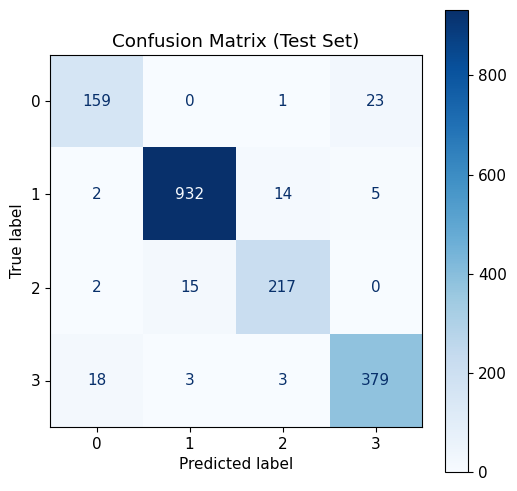

In [15]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display

stacking_results = {
    "train_accuracy": stacking_train_acc,
    "test_accuracy": stacking_test_acc,
    "y_train_true": y_train_feats,
    "y_train_pred": stacking.predict(X_train_scaled),
    "y_test_true": y_test_feats,
    "y_test_pred": stacking.predict(X_test_scaled),
}

print("=== Classification Report (Test Set) ===")
print(classification_report(stacking_results["y_test_true"], stacking_results["y_test_pred"]))

cm = confusion_matrix(stacking_results["y_test_true"], stacking_results["y_test_pred"])
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig_cm, ax_cm = plt.subplots(figsize=(6, 6))
disp.plot(cmap=plt.cm.Blues, ax=ax_cm)
ax_cm.set_title("Confusion Matrix (Test Set)")
display(fig_cm)

## ROC and P-R curves

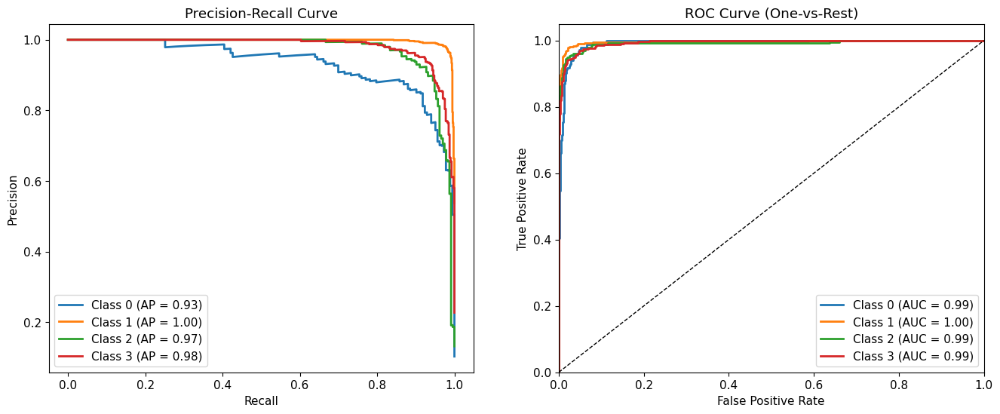

In [16]:
from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
from IPython.display import display

classes = np.unique(stacking_results["y_test_true"])
y_test_bin = label_binarize(stacking_results["y_test_true"], classes=classes)
y_score = stacking.predict_proba(X_test_scaled)
fig, (ax_pr, ax_roc) = plt.subplots(1, 2, figsize=(16, 6))
for i, class_label in enumerate(classes):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_score[:, i])
    ap = average_precision_score(y_test_bin[:, i], y_score[:, i])
    ax_pr.plot(recall, precision, lw=2, label=f'Class {class_label} (AP = {ap:.2f})')

ax_pr.set_xlabel('Recall')
ax_pr.set_ylabel('Precision')
ax_pr.set_title('Precision-Recall Curve')
ax_pr.legend(loc='lower left')

for i, class_label in enumerate(classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    ax_roc.plot(fpr, tpr, lw=2, label=f'Class {class_label} (AUC = {roc_auc:.2f})')

ax_roc.plot([0, 1], [0, 1], 'k--', lw=1)
ax_roc.set_xlim([0.0, 1.0])
ax_roc.set_ylim([0.0, 1.05])
ax_roc.set_xlabel('False Positive Rate')
ax_roc.set_ylabel('True Positive Rate')
ax_roc.set_title('ROC Curve (One-vs-Rest)')
ax_roc.legend(loc="lower right")

display(fig)


## Comparison with Base Model

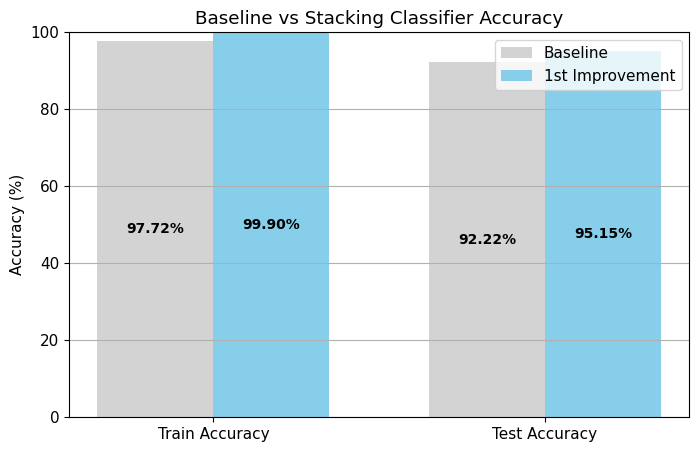

In [17]:
import matplotlib.pyplot as plt
from IPython.display import display

bl_train_acc = 97.72
bl_test_acc = 92.22
stack_train_acc = stacking_results["train_accuracy"]
stack_test_acc = stacking_results["test_accuracy"]
labels = ["Train Accuracy", "Test Accuracy"]
baseline = [bl_train_acc, bl_test_acc]
stacking = [stack_train_acc, stack_test_acc]
x = range(len(labels))
fig_combined, ax = plt.subplots(figsize=(8, 5))
bar_width = 0.35

bars1 = ax.bar([i - bar_width / 2 for i in x], baseline, width=bar_width, label="Baseline", color="lightgray")
bars2 = ax.bar([i + bar_width / 2 for i in x], stacking, width=bar_width, label="1st Improvement", color="skyblue")
for bars, values in zip([bars1, bars2], [baseline, stacking]):
    for bar, val in zip(bars, values):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            val / 2,
            f"{val:.2f}%",
            ha='center',
            va='center',
            fontsize=10,
            fontweight='bold'
        )

ax.set_ylim(0, 100)
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_ylabel("Accuracy (%)")
ax.set_title("Baseline vs Stacking Classifier Accuracy")
ax.legend()
ax.grid(axis='y')

display(fig_combined)

# Other classifiers

## 1. Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from sklearn.utils.class_weight import compute_sample_weight
import xgboost as xgb
import numpy as np

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_feats)
X_test_scaled = scaler.transform(X_test_feats)

sample_weights = compute_sample_weight(class_weight='balanced', y=y_train_feats)

rf = RandomForestClassifier(
    n_estimators=200,
    max_depth=10,
    class_weight='balanced',
    random_state=42
)

xgb_model = xgb.XGBClassifier(
    n_estimators=150,
    max_depth=4,
    learning_rate=0.05,
    random_state=42,
    objective='multi:softprob',
    num_class=len(np.unique(y_train_feats)),
    eval_metric='mlogloss',
)

meta_learner = LogisticRegression(
    random_state=42,
    class_weight='balanced'
)

stacking = StackingClassifier(
    estimators=[
        ('rf', rf),
        ('xgb', xgb_model),
    ],
    final_estimator=meta_learner,
    cv=5,
    n_jobs=-1
)

print("\nTraining Stacking Classifier with class imbalance handling…")
stacking.fit(X_train_scaled, y_train_feats, sample_weight=sample_weights)

train_preds = stacking.predict(X_train_scaled)
test_preds = stacking.predict(X_test_scaled)

print(f"Stacking Train Accuracy: {accuracy_score(y_train_feats, train_preds) * 100:.2f}%")
print(f"Stacking Test Accuracy: {accuracy_score(y_test_feats, test_preds) * 100:.2f}%")

print("\nClassification Report:")
print(classification_report(y_test_feats, test_preds))


Training Stacking Classifier with class imbalance handling…
Stacking Train Accuracy: 99.07%
Stacking Test Accuracy: 94.42%

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.91      0.86       183
           1       0.98      0.97      0.98       953
           2       0.89      0.93      0.91       234
           3       0.95      0.91      0.93       403

    accuracy                           0.94      1773
   macro avg       0.91      0.93      0.92      1773
weighted avg       0.95      0.94      0.94      1773



## 2. Hist Gradient Boosting Classifier

In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from sklearn.utils.class_weight import compute_sample_weight
import xgboost as xgb
import numpy as np

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_feats)
X_test_scaled = scaler.transform(X_test_feats)

sample_weights = compute_sample_weight(class_weight='balanced', y=y_train_feats)

hgb = HistGradientBoostingClassifier(
    max_iter=300,
    learning_rate=0.05,
    max_depth=8,
    random_state=42
)

xgb_model = xgb.XGBClassifier(
    n_estimators=300,
    max_depth=6,
    learning_rate=0.03,
    random_state=42,
    objective='multi:softprob',
    num_class=len(np.unique(y_train_feats)),
    eval_metric='mlogloss'
)

meta_learner = LogisticRegression(
    random_state=42,
    class_weight='balanced',
    max_iter=1000
)

stacking = StackingClassifier(
    estimators=[
        ('hgb', hgb),
        ('xgb', xgb_model),
    ],
    final_estimator=meta_learner,
    cv=5,
    n_jobs=-1
)

print("\nTraining Enhanced Stacking Classifier…")
stacking.fit(X_train_scaled, y_train_feats, sample_weight=sample_weights)

train_preds = stacking.predict(X_train_scaled)
test_preds = stacking.predict(X_test_scaled)

print(f"Stacking Train Accuracy: {accuracy_score(y_train_feats, train_preds) * 100:.2f}%")
print(f"Stacking Test Accuracy: {accuracy_score(y_test_feats, test_preds) * 100:.2f}%")

print("\nClassification Report:")
print(classification_report(y_test_feats, test_preds))


Training Enhanced Stacking Classifier…
Stacking Train Accuracy: 100.00%
Stacking Test Accuracy: 94.87%

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.89      0.87       183
           1       0.98      0.97      0.98       953
           2       0.90      0.94      0.92       234
           3       0.94      0.93      0.93       403

    accuracy                           0.95      1773
   macro avg       0.92      0.93      0.93      1773
weighted avg       0.95      0.95      0.95      1773



# Experimentation with Noisy dataset

In [ ]:
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import StackingClassifier
from sklearn.utils.class_weight import compute_class_weight
import xgboost as xgb
import clip 
import torch.nn.functional as F

MEAN_BGR = np.array([103.939, 116.779, 123.68], dtype=np.float32)
device = "cuda" if torch.cuda.is_available() else "cpu"

def undo_resnet_preprocess(x):
    bgr = x.copy()
    bgr[..., 0] += MEAN_BGR[0]
    bgr[..., 1] += MEAN_BGR[1]
    bgr[..., 2] += MEAN_BGR[2]
    rgb = bgr[..., ::-1]
    rgb = np.clip(rgb, 0, 255).astype(np.uint8)
    return rgb

class CLIPArrayDataset(Dataset):
    def __init__(self, X, y, preprocess, train=False):
        self.X = X
        self.y = y
        self.preprocess = preprocess
        self.train = train
        self.augment = transforms.Compose([
            transforms.RandomHorizontalFlip(p=0.5),
        ]) if train else None

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        arr = undo_resnet_preprocess(self.X[idx])
        img = Image.fromarray(arr)
        if self.train and self.augment:
            img = self.augment(img)
        img = self.preprocess(img)
        label = int(self.y[idx])
        return img, label

class CLIPFineTune(nn.Module):
    def __init__(self, clip_model, num_classes):
        super(CLIPFineTune, self).__init__()
        self.clip_model = clip_model.visual
        self.classifier = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes),
        )

    def forward(self, x):
        features = self.clip_model(x)
        logits = self.classifier(features)
        return features, logits

class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, weight=self.alpha, reduction='none')
        pt = torch.exp(-ce_loss)
        focal_loss = ((1 - pt) ** self.gamma) * ce_loss

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

model, preprocess = clip.load("ViT-B/32", device=device)
model = model.float()
model.eval()

X_train, X_test, y_train, y_test = train_test_split(
    X_noisy, y_numeric, test_size=0.2, stratify=y_numeric, random_state=42
)

train_ds = CLIPArrayDataset(X_train, y_train, preprocess, train=True)
test_ds = CLIPArrayDataset(X_test, y_test, preprocess, train=False)

train_loader = DataLoader(train_ds, batch_size=64, shuffle=True, num_workers=0)
test_loader = DataLoader(test_ds, batch_size=64, shuffle=False, num_workers=0)

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float32).to(device)

print("\n Fine-Tuning CLIP…")
num_classes = len(np.unique(y_train))
clip_finetune = CLIPFineTune(model, num_classes).to(device)
optimizer = optim.Adam(clip_finetune.parameters(), lr=1e-5, weight_decay=1e-4)
criterion = FocalLoss(alpha=class_weights_tensor, gamma=2.0)

num_epochs = 5
clip_finetune.train()
for epoch in range(num_epochs):
    total_loss = 0
    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        _, logits = clip_finetune(imgs)
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {total_loss/len(train_loader):.4f}")

def extract_finetuned_features(loader, model):
    model.eval()
    feats, labs = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            features, _ = model(imgs)
            feats.append(features.cpu().numpy())
            labs.append(labels.numpy())
    return np.vstack(feats), np.concatenate(labs)

print("Extracting fine-tuned train features…")
X_train_feats, y_train_feats = extract_finetuned_features(train_loader, clip_finetune)

print("Extracting fine-tuned test features…")
X_test_feats, y_test_feats = extract_finetuned_features(test_loader, clip_finetune)


 Fine-Tuning CLIP…
Epoch 1/5, Loss: 0.5138
Epoch 2/5, Loss: 0.2527
Epoch 3/5, Loss: 0.1504
Epoch 4/5, Loss: 0.1209
Epoch 5/5, Loss: 0.0835
Extracting fine-tuned train features…
Extracting fine-tuned test features…


## 1. MLP

In [11]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_feats)
X_test_scaled = scaler.transform(X_test_feats)

print("\n Training Stacking Classifier (MLP + XGBoost)…")
mlp = MLPClassifier(
    hidden_layer_sizes=(512, 256),
    max_iter=1000,
    alpha=0.01,  
    learning_rate_init=0.001,
    solver='adam',
    random_state=42,
    early_stopping=True,
    validation_fraction=0.2,
    n_iter_no_change=20,
)

xgb_model = xgb.XGBClassifier(
    n_estimators=150,
    max_depth=4,
    learning_rate=0.05,
    random_state=42,
    eval_metric='logloss',
)

meta_learner = LogisticRegression(random_state=42)

stacking = StackingClassifier(
    estimators=[
        ('mlp', mlp),
        ('xgb', xgb_model),
    ],
    final_estimator=meta_learner,
    cv=5,
)

stacking.fit(X_train_scaled, y_train_feats)

stacking_train_acc = accuracy_score(y_train_feats, stacking.predict(X_train_scaled)) * 100
stacking_test_acc = accuracy_score(y_test_feats, stacking.predict(X_test_scaled)) * 100

print(f"Stacking Train Accuracy: {stacking_train_acc:.2f}%")
print(f"Stacking Test Accuracy: {stacking_test_acc:.2f}%")




 Training Stacking Classifier (MLP + XGBoost)…
Stacking Train Accuracy: 99.38%
Stacking Test Accuracy: 92.95%


## 2. Random Forests

In [ ]:
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from sklearn.utils.class_weight import compute_sample_weight
import xgboost as xgb
import numpy as np

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_feats)
X_test_scaled = scaler.transform(X_test_feats)

sample_weights = compute_sample_weight(class_weight='balanced', y=y_train_feats)
rf = RandomForestClassifier(
    n_estimators=200,
    max_depth=10,
    class_weight='balanced',
    random_state=42
)

xgb_model = xgb.XGBClassifier(
    n_estimators=150,
    max_depth=4,
    learning_rate=0.05,
    random_state=42,
    objective='multi:softprob',
    num_class=len(np.unique(y_train_feats)),
    eval_metric='mlogloss',
)

meta_learner = LogisticRegression(
    random_state=42,
    class_weight='balanced'
)

stacking = StackingClassifier(
    estimators=[
        ('rf', rf),
        ('xgb', xgb_model),
    ],
    final_estimator=meta_learner,
    cv=5,
    n_jobs=-1
)

print("\nTraining Stacking Classifier with class imbalance handling…")
stacking.fit(X_train_scaled, y_train_feats, sample_weight=sample_weights)
train_preds = stacking.predict(X_train_scaled)
test_preds = stacking.predict(X_test_scaled)

print(f"Stacking Train Accuracy: {accuracy_score(y_train_feats, train_preds) * 100:.2f}%")
print(f"Stacking Test Accuracy: {accuracy_score(y_test_feats, test_preds) * 100:.2f}%")
print("\nClassification Report:")
print(classification_report(y_test_feats, test_preds))


Training Stacking Classifier with class imbalance handling…
Stacking Train Accuracy: 98.46%
Stacking Test Accuracy: 91.93%

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.81      0.80       183
           1       0.98      0.95      0.96       953
           2       0.82      0.94      0.87       234
           3       0.92      0.89      0.90       403

    accuracy                           0.92      1773
   macro avg       0.87      0.90      0.88      1773
weighted avg       0.92      0.92      0.92      1773



## 3. Hist Gradient Boosting

In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from sklearn.utils.class_weight import compute_sample_weight
import xgboost as xgb
import numpy as np

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_feats)
X_test_scaled = scaler.transform(X_test_feats)

sample_weights = compute_sample_weight(class_weight='balanced', y=y_train_feats)
hgb = HistGradientBoostingClassifier(
    max_iter=300,
    learning_rate=0.05,
    max_depth=8,
    random_state=42
)

xgb_model = xgb.XGBClassifier(
    n_estimators=300,
    max_depth=6,
    learning_rate=0.03,
    random_state=42,
    objective='multi:softprob',
    num_class=len(np.unique(y_train_feats)),
    eval_metric='mlogloss'
)

meta_learner = LogisticRegression(
    random_state=42,
    class_weight='balanced',
    max_iter=1000
)

stacking = StackingClassifier(
    estimators=[
        ('hgb', hgb),
        ('xgb', xgb_model),
    ],
    final_estimator=meta_learner,
    cv=5,
    n_jobs=-1
)

print("\nTraining Enhanced Stacking Classifier…")
stacking.fit(X_train_scaled, y_train_feats, sample_weight=sample_weights)
train_preds = stacking.predict(X_train_scaled)
test_preds = stacking.predict(X_test_scaled)

print(f"Stacking Train Accuracy: {accuracy_score(y_train_feats, train_preds) * 100:.2f}%")
print(f"Stacking Test Accuracy: {accuracy_score(y_test_feats, test_preds) * 100:.2f}%")
print("\nClassification Report:")
print(classification_report(y_test_feats, test_preds))


Training Enhanced Stacking Classifier…
Stacking Train Accuracy: 100.00%
Stacking Test Accuracy: 91.65%

Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.81      0.78       183
           1       0.96      0.97      0.96       953
           2       0.88      0.87      0.87       234
           3       0.91      0.87      0.89       403

    accuracy                           0.92      1773
   macro avg       0.88      0.88      0.88      1773
weighted avg       0.92      0.92      0.92      1773



## 

# Additional work done in this deliverable




## Fine-Tuning CLIP with Focal Loss

In the second improvement, Focal Loss was employed during the fine-tuning of the CLIP model to directly address the issue of class imbalance. Unlike standard CrossEntropy loss, which treats all samples equally, Focal Loss modifies the loss function to down-weight well-classified examples and focus more on hard, misclassified examples. It introduces a modulating factor to handle imbalance.
This makes it especially useful for imbalanced classification tasks where certain classes dominate and others have fewer examples. In our case, where deer species are unevenly distributed, focal loss allowed the model to pay more attention to the minority classes, improving recall and F1-scores for those underrepresented categories. This change led to a more balanced and fair model that doesn’t overfit on the dominant class.

### Improvement analysis 

### Fine-Tuning CLIP: Loss Comparison (With vs. Without Focal Loss)

| Epoch | Loss (Without Focal Loss) | Loss (With Focal Loss) |
|-------|----------------------------|-------------------------|
| 1     | 0.6561                     | 0.4408                  |
| 2     | 0.3369                     | 0.1765                  |
| 3     | 0.2013                     | 0.1091                  |
| 4     | 0.1505                     | 0.0899                  |
| 5     | 0.1123                     | 0.0621                  |

**Observation**: Focal Loss led to faster convergence and lower final training loss, indicating better focus on harder-to-classify samples and enhanced learning from minority classes.


## Integration of Random Forest and Histogram Gradient Boosting Classifiers

In addition to the previously used MLP and XGBoost  stacking classifier, this improvement incorporates Random Forest (RF) with xg boost and Histogram-based Gradient Boosting (HGB) with xg boost stacking classifiers. The motivation for using these models stems from their robustness against overfitting, strong performance on small-to-medium structured datasets, and their inherent ability to handle imbalanced data without requiring extensive preprocessing. Random Forests, through bootstrap aggregation and feature randomness, provide variance reduction, while HGB classifiers, being a highly efficient variant of gradient boosting, optimize training speed and memory use while still handling skewed class distributions effectively. All three trained on CLIP-extracted features from the clean dataset. Their predictions were evaluated and compared, enabling the selection of the best-performing model based on validation accuracy and F1 scores. This model benchmarking process helped in choosing the most sensitive and robust model.

### Results analysis

###  Classifier Performance on Clean Data

| Classifier               | Train Acc | Test Acc | Precision (Macro) | Recall (Macro) | F1-Score (Macro) |
|--------------------------|-----------|----------|--------------------|----------------|------------------|
| MLP + XGBoost            | 99.90%    | 95.15%   | 0.93               | 0.93           | 0.93             |
| Random Forest + XGBoost  | 99.07%    | 94.42%   | 0.91               | 0.93           | 0.92             |
| Hist. GradBoost + XGBoost| 98.91%    | 94.86%   | 0.92               | 0.93           | 0.92             |

**Analysis**:  
Among all classifiers, the MLP + XGBoost combination yielded the highest test accuracy at 95.15% and the best macro-averaged F1-score of 0.93, making it the most effective overall model on clean data.  
The Histogram Gradient Boosting stack closely followed with 94.86% accuracy and robust macro F1 of 0.92, while showing slightly better balance between precision and recall than Random Forest.  
**Random Forest + XGBoost showed the lowest precision but had the highest recall for class 0, indicating better sensitivity to minority classes, though with a small tradeoff in overall precision.


### Testing Robustness with Gaussian Noisy Data

To evaluate the robustness and sensitivity of the trained classifiers, synthetic noisy datasets were created by adding Gaussian noise to the CLIP feature vectors. This step simulates potential real-world data corruptions or sensor noise, which is critical in wildlife monitoring scenarios where environmental interference is common. The same three classifiers : MLP, Random Forest, and Histogram Gradient Boosting were then tested on this noisy data. By comparing their performance metrics (especially the drop in accuracy and F1-scores), the experiment measured how resilient each model was to feature noise. This stress test helps reveal whether the model generalizes well or overfits on clean data. While there was a decrease in accuracy for noisy data on all 3 models, which is reasonable given the high noise in the dataset, still our model accuracies remain above 90% and no sharp degradation was observed. This provides good insight into the sensitivity and robustness of the models. These insights are vital in selecting models not just based on clean accuracy, but also on their real-world reliability.

### Classifier Performance on Noisy Data

| Classifier               | Train Accuracy | Test Accuracy |
|--------------------------|----------------|---------------|
| MLP + XGBoost            | 99.38%         | 92.95%        |
| Random Forest + XGBoost  | 98.46%         | 91.93%        |
| Hist. GradBoost + XGBoost| 100.00%        | 91.65%        |

**Analysis:**

The MLP + XGBoost combination outperformed the others on noisy data with a test accuracy of 92.95%, demonstrating better generalization and resilience to perturbations like Gaussian noise.  
Random Forest + XGBoost had a decent performance with 91.93% test accuracy, slightly more robust than Histogram Gradient Boosting despite a lower training accuracy.  
Interestingly, Histogram Gradient Boosting + XGBoost achieved perfect training accuracy (100%), which is a strong sign of overfitting and correlates with its relatively lower test accuracy (91.65%), suggesting reduced robustness to noise.  
Overall, the results show that deep architectures (MLP) provide superior noise tolerance when compared to ensemble-only approaches under fine-grained classification with class imbalance.


# Analysis and Insights

## Pipeline Architecture Summary

* Raw Missouri Deer Dataset
* Flattening and organizing the directories
* Detection of animals using MegaDetector V6
* Cropping the detected bounding boxes
* Extracting features using CLIP
* Fine-tuning CLIP with focal loss for class imbalance
* Training classifiers (MLP, Random Forest, HistGradientBoost)
* Applying stacking ensembles (MLP + XGBoost, RF + XGBoost, HistGB + XGBoost)
* Evaluation under clean and noisy conditions
* Visualizing performance using metrics and confusion matrices

## Methodology

The pipeline for multi-species deer classification using the Missouri camera trap dataset is structured into two main stages: **Detection** and **Classification**, with additional robustness evaluation under noisy data conditions.

### Detection with MegaDetector V6 (YOLOv9-c)

Detection is performed using MegaDetector V6, a YOLOv9-c variant trained specifically for wildlife monitoring. This detector identifies animals within raw camera trap images and returns bounding boxes with confidence scores. Only high-confidence animal regions are retained and cropped for further processing, effectively reducing background clutter and improving downstream classification performance.

### Classification Phase

#### Fine-Tuned CLIP Feature Extraction

The cropped animal images are passed through the CLIP encoder to extract high-level semantic features. Unlike the initial version, the encoder is now fine-tuned using **focal loss**, which is designed to improve learning in the presence of class imbalance by focusing more on hard-to-classify examples. This results in significantly improved training dynamics and generalization performance, especially for minority classes.

#### Classifier Ensemble Design

To evaluate the classification performance, multiple stacking ensembles were tested using different base learners:

- **MLP + XGBoost**  
- **Random Forest + XGBoost**
- **Histogram Gradient Boosting + XGBoost**

Each of these base models was trained on CLIP features and stacked with a **logistic regression meta-learner** to capture linear and non-linear patterns. This approach enhances robustness by leveraging complementary strengths of diverse classifiers.

#### Noisy Data Evaluation

To simulate real-world imperfections such as environmental noise and sensor degradation, **Gaussian noise** was added to the test set. All stacking ensembles were re-evaluated on this noisy dataset to test their resilience and generalization capability.

## Overall Insights & Benefits

- Fine-tuning CLIP with **focal loss** significantly boosts feature quality and reduces bias toward majority classes, improving both accuracy and fairness.
- The **MLP + XGBoost** ensemble consistently outperformed others under both clean and noisy conditions, confirming its superior generalization and robustness.
- Histogram Gradient Boosting exhibited signs of **overfitting**, achieving perfect training accuracy but relatively lower test accuracy, especially on noisy inputs.
- Ensemble methods, particularly stacking, proved effective at capturing complex relationships, offering strong results even with limited and imbalanced data.
- Pretrained models (CLIP and MegaDetector) made the pipeline efficient and scalable, eliminating the need for large-scale retraining.
- Incorporating **noise resilience testing** adds practical value by approximating real deployment environments, providing more realistic expectations of model performance.

